<a href="https://colab.research.google.com/github/SahandSomi/airbnb_price_prediction/blob/main/CAPSTONE_Team_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CAPSTONE
## Group #1
### Group Names:  Bianca Angotti, Sepideh Mirabi, Mona Ahmadirad, Caleb Blessed-Sayah, Sahand Somi
### Choice of Dataset: New York City Airbnb Open Data
### This includes some of the information and questions from PM6 as our final review.

** NOTE: We also have our GitHub code that can be seen here: https://github.com/SahandSomi/airbnb_price_prediction **

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import urllib
import matplotlib.pyplot as pltv
from sklearn.model_selection import train_test_split
from sklearn import linear_model, metrics, tree, neighbors, ensemble

# import warnings
# warnings.filterwarnings("ignore")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
files_dir = "/content/drive/Shareddrives/AMII Technician Group/Datasets/"
# filename = files_dir + "data_time.csv"
filename = files_dir + "data_time.csv"
df = pd.read_csv(filename)

# converting price to log
df.drop(df[df.price == 0.0].index, inplace=True)
df.price = np.log(df.price)

In [ ]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
room_type                          object
price                             float64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
calculated_host_listings_count      int64
availability_365                    int64
museum_of_the_city_of_new_york    float64
central_park                      float64
empire_state                      float64
swindler_cove                     float64
broadway                          float64
rockefeller center                float64
time_square                       float64
brooklyn_bridge                   float64
statue_of_lib                     float64
st_joseph's_church                float64
brooklyn_botanic_garden           

In [ ]:
print("There are various columns containing missing values:\n")
print(df.isnull().any())
print("\nSpecifically there are this many missing per feature:\n")
print(df.isnull().sum())

missing_features = df[(df.isnull()).any(1)]
display(missing_features)
print("Total rows missing values: "+str(len(missing_features))+" out of "+str(len(df)))

There are various columns containing missing values:

id                                False
name                               True
host_id                           False
host_name                          True
neighbourhood_group               False
neighbourhood                     False
room_type                         False
price                             False
minimum_nights                    False
number_of_reviews                 False
last_review                        True
calculated_host_listings_count    False
availability_365                  False
museum_of_the_city_of_new_york    False
central_park                      False
empire_state                      False
swindler_cove                     False
broadway                          False
rockefeller center                False
time_square                       False
brooklyn_bridge                   False
statue_of_lib                     False
st_joseph's_church                False
brooklyn_botanic_garden   

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,room_type,price,minimum_nights,number_of_reviews,...,new_york_botanical_garden,yankee_stadium,bronx_zoo,woodlawn_cemetery,graniteville,lighthouse,seguine_mansion,jfk_airport,lga_airport,ewr_airport
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,Private room,5.010635,3,0,...,94.4531,34.5138,94.0927,123.0046,330.4056,294.7099,449.4453,236.0258,-1,340.3023
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,Entire home/apt,5.247024,7,0,...,110.9152,54.8293,108.8398,144.6267,311.9764,276.2807,431.0161,217.5966,-1,324.6592
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,Private room,4.382027,4,0,...,53.8513,56.4357,70.0257,68.8967,408.2491,372.5535,527.2888,313.9277,-1,397.4267
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,Private room,3.555348,60,0,...,241.3515,191.8464,279.4376,275.0631,247.1624,211.4668,366.2021,130.2082,-1,288.0115
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,Private room,5.010635,1,0,...,297.5607,248.0556,335.6468,331.2723,276.2564,240.5608,395.2961,153.6414,-1,317.1055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,Private room,4.248495,2,0,...,254.7822,205.2771,292.8683,288.4938,244.7883,209.0927,363.8280,125.0936,-1,285.6374
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,Private room,3.688879,4,0,...,235.0125,185.5074,273.0986,268.7241,250.5488,214.8532,369.5885,129.0865,-1,291.3979
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,Entire home/apt,4.744932,10,0,...,96.1140,36.0406,95.7536,125.6129,338.2280,302.5324,457.2677,243.8482,-1,338.2704
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,Shared room,4.007333,1,0,...,171.2903,111.2169,232.4360,200.7892,273.8604,238.1647,392.9000,224.7103,-1,263.0379


Total rows missing values: 10073 out of 48884


In [ ]:
df_p = df[["price","museum_of_the_city_of_new_york", "central_park", "empire_state", "swindler_cove", "broadway", "rockefeller center", "time_square", "brooklyn_bridge", "statue_of_lib", "st_joseph's_church","brooklyn_botanic_garden",]]
display(df_p.corr())
px.imshow(df_p.corr())

,price,museum_of_the_city_of_new_york,central_park,empire_state,swindler_cove,broadway,rockefeller center,time_square,brooklyn_bridge,statue_of_lib,st_joseph's_church,brooklyn_botanic_garden
price,1.000000,-0.206155,-0.275659,-0.374782,-0.116003,-0.185711,-0.349375,-0.365918,-0.273599,-0.295530,-0.373848,-0.022560
museum_of_the_city_of_new_york,-0.206155,1.000000,0.972925,0.679135,0.909911,0.976156,0.821692,0.787973,0.065166,0.095968,0.432939,-0.322628
central_park,-0.275659,0.972925,1.000000,0.767681,0.854087,0.947970,0.887352,0.860956,0.172574,0.203602,0.545067,-0.257170
empire_state,-0.374782,0.679135,0.767681,1.000000,0.449060,0.608666,0.965757,0.978106,0.717595,0.742300,0.939894,0.284151
swindler_cove,-0.116003,0.909911,0.854087,0.449060,1.000000,0.956556,0.608640,0.581607,-0.186318,-0.148311,0.183130,-0.537417
broadway,-0.185711,0.976156,0.947970,0.608666,0.956556,1.000000,0.755619,0.728204,-0.037026,0.002320,0.353212,-0.429433
rockefeller center,-0.349375,0.821692,0.887352,0.965757,0.608640,0.755619,1.000000,0.994049,0.565264,0.589089,0.843375,0.127637
time_square,-0.365918,0.787973,0.860956,0.978106,0.581607,0.728204,0.994049,1.000000,0.604144,0.631044,0.873871,0.151849
brooklyn_bridge,-0.273599,0.065166,0.172574,0.717595,-0.186318,-0.037026,0.565264,0.604144,1.000000,0.986688,0.889341,0.816435
statue_of_lib,-0.295530,0.095968,0.203602,0.742300,-0.148311,0.002320,0.589089,0.631044,0.986688,1.000000,0.909665,0.761771


In [ ]:
df_p = df[["price", "nyc_stock", "dyker_heights", "prospect_park_zoo", "industry_city", "grand army plaza","brooklyn jeights promenade", "brooklyn_museum_fountain", "Rockaways", "forest_hills_stadium", "american_airpower_museum", "Coliseum", "little_italy",
                      "Cloisters", ]]
                      
display(df_p.corr())
px.imshow(df_p.corr())

,price,nyc_stock,dyker_heights,prospect_park_zoo,industry_city,grand army plaza,brooklyn jeights promenade,brooklyn_museum_fountain,Rockaways,forest_hills_stadium,american_airpower_museum,Coliseum,little_italy,Cloisters
price,1.000000,-0.299859,-0.027938,-0.029260,-0.101956,-0.051940,-0.181100,-0.026694,0.214790,0.125549,0.188405,0.198160,-0.089512,-0.117048
nyc_stock,-0.299859,1.000000,0.718708,0.763745,0.824839,0.799735,0.946245,0.771806,0.039035,0.186255,-0.128412,-0.122646,-0.178351,-0.161876
dyker_heights,-0.027938,0.718708,1.000000,0.960468,0.979617,0.947825,0.860372,0.942907,0.491255,0.312064,0.209572,0.240622,-0.674985,-0.678573
prospect_park_zoo,-0.029260,0.763745,0.960468,1.000000,0.961000,0.995784,0.905357,0.994680,0.450721,0.424046,0.264179,0.284669,-0.560692,-0.567382
industry_city,-0.101956,0.824839,0.979617,0.961000,1.000000,0.960458,0.927440,0.946047,0.383085,0.269527,0.122230,0.146535,-0.586188,-0.584799
grand army plaza,-0.051940,0.799735,0.947825,0.995784,0.960458,1.000000,0.929738,0.994816,0.418376,0.427293,0.242894,0.262005,-0.523182,-0.529961
brooklyn jeights promenade,-0.181100,0.946245,0.860372,0.905357,0.927440,0.929738,1.000000,0.913366,0.232973,0.324725,0.050488,0.063861,-0.352275,-0.356021
brooklyn_museum_fountain,-0.026694,0.771806,0.942907,0.994680,0.946047,0.994816,0.913366,1.000000,0.460141,0.472412,0.291871,0.311313,-0.540659,-0.549826
Rockaways,0.214790,0.039035,0.491255,0.450721,0.383085,0.418376,0.232973,0.460141,1.000000,0.656120,0.736310,0.755979,-0.686484,-0.725064
forest_hills_stadium,0.125549,0.186255,0.312064,0.424046,0.269527,0.427293,0.324725,0.472412,0.656120,1.000000,0.849686,0.859876,-0.186023,-0.235946


In [ ]:
df_p = df[["price", "new_york_botanical_garden", "yankee_stadium", "bronx_zoo", "woodlawn_cemetery", "graniteville", "lighthouse", "seguine_mansion",
                      "jfk_airport","lga_airport", "ewr_airport",]]
display(df_p.corr())
px.imshow(df_p.corr())

,price,new_york_botanical_garden,yankee_stadium,bronx_zoo,woodlawn_cemetery,graniteville,lighthouse,seguine_mansion,jfk_airport,lga_airport,ewr_airport
price,1.000000,-0.088001,-0.121781,-0.019242,-0.083444,-0.253053,-0.257749,-0.248275,0.187630,NaN,-0.329622
new_york_botanical_garden,-0.088001,1.000000,0.982125,0.971452,0.998350,-0.297519,-0.289537,-0.307102,-0.625518,NaN,-0.105796
yankee_stadium,-0.121781,0.982125,1.000000,0.952513,0.975978,-0.229027,-0.220297,-0.239703,-0.601966,NaN,-0.016330
bronx_zoo,-0.019242,0.971452,0.952513,1.000000,0.969552,-0.402727,-0.396783,-0.409464,-0.569563,NaN,-0.232380
woodlawn_cemetery,-0.083444,0.998350,0.975978,0.969552,1.000000,-0.316302,-0.308756,-0.325278,-0.640859,NaN,-0.123326
graniteville,-0.253053,-0.297519,-0.229027,-0.402727,-0.316302,1.000000,0.996873,0.995343,0.120017,NaN,0.938123
lighthouse,-0.257749,-0.289537,-0.220297,-0.396783,-0.308756,0.996873,1.000000,0.990519,0.134493,NaN,0.939876
seguine_mansion,-0.248275,-0.307102,-0.239703,-0.409464,-0.325278,0.995343,0.990519,1.000000,0.101274,NaN,0.927770
jfk_airport,0.187630,-0.625518,-0.601966,-0.569563,-0.640859,0.120017,0.134493,0.101274,1.000000,NaN,-0.034205
lga_airport,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
from sklearn.preprocessing import StandardScaler

# Removed only errors in the data, not outliers as the large numbers are still valid
# When testing Airbnb's platform, 1125 was maximum stay, so anyone asking for a min stay above 1125 would be an error.
min_nights_drop = df[df.minimum_nights > 1125.0].index
print("Total number of data points being dropped as min nights are greater than 1125: "+str(len(min_nights_drop)))
df.drop(min_nights_drop, inplace=True)

# original data
# numerical_features = ["latitude", "longitude", "minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365"]
# categorical_features = ["neighbourhood", "room_type"]

# new data
numerical_features = ["minimum_nights", "number_of_reviews", "calculated_host_listings_count", "availability_365",
                      "museum_of_the_city_of_new_york", "central_park", "empire_state", "swindler_cove", "broadway", "rockefeller center", "time_square", "brooklyn_bridge",
                      "statue_of_lib", "st_joseph's_church", "brooklyn_botanic_garden", "nyc_stock", "dyker_heights", "prospect_park_zoo", "industry_city", "grand army plaza",
                      "brooklyn jeights promenade", "brooklyn_museum_fountain", "Rockaways", "forest_hills_stadium", "american_airpower_museum", "Coliseum", "little_italy",
                      "Cloisters", "new_york_botanical_garden", "yankee_stadium", "bronx_zoo", "woodlawn_cemetery", "graniteville", "lighthouse", "seguine_mansion",
                      "jfk_airport","lga_airport", "ewr_airport"]
categorical_features = ["neighbourhood","neighbourhood_group", "room_type"]


total_features = numerical_features + categorical_features
target = "price"
updated_target = df[target]
updated_df = df[total_features]

# change the neighbourhood, neighbourhood_group, & room_type to categories
updated_df = pd.get_dummies(updated_df, columns=["neighbourhood"], prefix='neighbourhood', drop_first=True, sparse = True)
updated_df = pd.get_dummies(updated_df, columns=["neighbourhood_group"], prefix='neighbourhood_group', drop_first=True, sparse = True)
updated_df = pd.get_dummies(updated_df, columns=["room_type"], prefix='room_type', drop_first=True, sparse = True)

# change them to numpy values
updated_target_numpy = updated_target.to_numpy()
updated_target_numpy = updated_target_numpy.reshape(-1, 1)

# ------------------------------------------------------------------------
# # DO BINNING HERE BEFORE TRAINING AND TEST DATA --> removed as we wish to do regression instead
# # separate price from continuous value into 5 separate bins
# from sklearn.preprocessing import KBinsDiscretizer
# est = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform')
# # est = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
# # by using the uniform strategy, you create massive unequal weights between 
# # the different labels, which produces great accuracy for some groups and horrible accuracy for others
# est.fit(updated_target_numpy)
# y_BIN = (est.transform(updated_target_numpy)).flatten()
# # np.where(y_BIN == 0)
# # print(y_BIN[100:200])
# ------------------------------------------------------------------------

# separate the data 
X_train, X_test, y_train, y_test = train_test_split(updated_df, updated_target_numpy, test_size=0.33, random_state=42)

# standardize the data
scaler = StandardScaler()
scaler.fit(X_train[numerical_features])
X_train[numerical_features] = scaler.transform(X_train[numerical_features])
X_test[numerical_features] = scaler.transform(X_test[numerical_features])
display(X_test.head())

Total number of data points being dropped as min nights are greater than 1125: 1


,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,museum_of_the_city_of_new_york,central_park,empire_state,swindler_cove,broadway,rockefeller center,...,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside,neighbourhood_group_Brooklyn,neighbourhood_group_Manhattan,neighbourhood_group_Queens,neighbourhood_group_Staten Island,room_type_Private room,room_type_Shared room
41320,0.243249,-0.433148,-0.095075,-0.634756,-0.157072,-0.701780,-1.150451,0.029554,-0.395139,-0.820667,...,0,0,0,0,0,1,0,0,1,0
22080,-0.102863,-0.388008,-0.186169,-0.855636,-1.026354,-1.230926,-1.062697,-0.785877,-0.960752,-1.287326,...,0,0,0,0,0,1,0,0,0,0
18779,-0.300640,-0.500859,-0.186169,-0.855636,-1.516099,-1.362077,-0.175734,-1.079029,-1.206356,-0.735852,...,0,0,0,0,0,1,0,0,1,0
25495,-0.201751,-0.523429,-0.186169,-0.855636,-1.667171,-1.321040,-0.078224,-1.202261,-1.336817,-0.695485,...,0,0,0,0,0,1,0,0,1,0
44319,-0.152307,-0.523429,-0.155804,1.924403,-1.287080,-0.929476,0.103926,-1.623313,-1.530660,-0.164510,...,0,0,0,0,0,1,0,0,1,0


In [ ]:
for feature in numerical_features:
  fig = px.histogram(df, x=feature)
  fig.show()

In [ ]:
for feature in categorical_features:
  fig = px.histogram(df, x=feature)
  fig.show()

1.  Use scikit-learn’s `sklearn.neighbors.KNeighborsRegressor` to implement a
k-NN regressor for your dataset. Note: As you saw in the lecture there are two approaches to determine the weights for k-NN regression, equal weights and inverse distance weighted average. You want to try both methods and compare the results and use the best one for the other sections.

In [ ]:
allmodels = []

a. The default hyperparameter for the function is weights=’uniform’, meaning all points in the neighborhood are weighted equally. First run the method with this default.

In [ ]:
reg = neighbors.KNeighborsRegressor(n_neighbors = 25).fit(X_train, y_train)
allmodels.append((reg, "KNeighborsRegressor weight uniform"))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



b. Now set the weights=’distance’. This will weight the points by the inverse of their distance so that closer points have more influence than those that are further away.


In [ ]:
reg = neighbors.KNeighborsRegressor(n_neighbors = 25, weights="distance").fit(X_train, y_train)
allmodels.append((reg, "KNeighborsRegressor weight distance"))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



2. Use scikit-learn’s `sklearn.tree.DecisionTreeRegressor` to implement a
decision tree regressor.

In [ ]:
reg = tree.DecisionTreeRegressor(max_depth = 6).fit(X_train, y_train)
allmodels.append((reg, "DecisionTreeRegressor"))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



3. Use scikit-learn’s `sklearn.ensemble.RandomForestRegressor` to implement a
random forest regressor for your dataset.

In [ ]:
reg = ensemble.RandomForestRegressor(max_depth = 15, max_samples = 0.6, max_features = "auto", n_estimators = 500).fit(X_train, y_train)
allmodels.append((reg, "RandomForestRegressor"))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



##Evaluating the Algorithm


1. To evaluate the performance of your regressors, use the following metrics: mean absolute
error, mean squared error, root mean squared error and R-squared score. The scikit-learn
library contains functions that can help calculate these values for us. To do so, use this
code from the metrics package:

In [ ]:
d = []

for fit_model, fit_model_name in allmodels:
  yhat_test = fit_model.predict(X_test)
  
  MAE = metrics.mean_absolute_error(np.exp(y_test), np.exp(yhat_test))
  MSE = metrics.mean_squared_error(np.exp(y_test),np.exp(yhat_test))
  RMSE = np.sqrt(metrics.mean_squared_error(np.exp(y_test), np.exp(yhat_test)))
  MAPE = metrics.mean_absolute_percentage_error(np.exp(y_test), np.exp(yhat_test))
  R2_Score = metrics.r2_score(np.exp(y_test),np.exp(yhat_test))
  
  d.append([fit_model_name, MAE, MSE, RMSE, MAPE, R2_Score])

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



##QuAM Comparison

1. **Compare your Regressors**: provide a comparison table of the performance for all QuAMs
you’ve built using the different losses. This will help us quickly evaluate which QuAMs work
well and which don’t. It will also serve as a communication tool to summarize to
stakeholders what you’ve tried, what worked best, and why

In [ ]:
summary_df = pd.DataFrame(d, columns = ['Algorithm','MAE','MSE', 'RMSE','MAPE', 'R2 Score'])
display(summary_df)

,Algorithm,MAE,MSE,RMSE,MAPE,R2 Score
0,KNeighborsRegressor weight uniform,60.455053,48034.423937,219.167570,0.380027,0.112937
1,KNeighborsRegressor weight distance,58.934683,47365.791305,217.636834,0.363514,0.125285
2,DecisionTreeRegressor,60.766976,51168.750766,226.205108,0.360067,0.055055
3,RandomForestRegressor,56.067468,45637.568560,213.629512,0.327556,0.157200


2. **Comparison of all Regressors**: we recommend constructing a table that combines your
findings from PM5 with those of PM6 for all of the regressors methods and their losses. This
will provide the best visual summary for both you & your audience during your presentation.


In [ ]:
# from PM5
pm5models = []

reg = linear_model.LinearRegression().fit(X_train, y_train)
pm5models.append((reg, "Linear Regression"))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



In [ ]:
reg = linear_model.Ridge().fit(X_train, y_train)
pm5models.append((reg, "Ridge"))

log_regularization_coefficient = -15.9 #@param {type:"slider", min:-30, max:10, step:0.1}
regularization_coefficient = np.exp(log_regularization_coefficient)
reg = linear_model.Ridge(alpha=regularization_coefficient).fit(X_train, y_train)
pm5models.append((reg, "Ridge Alpha "+str(log_regularization_coefficient)))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



In [ ]:
reg = linear_model.Lasso().fit(X_train, y_train)
pm5models.append((reg, "Lasso"))


log_regularization_coefficient = -10.5 #@param {type:"slider", min:-30, max:10, step:0.1}
regularization_coefficient = np.exp(log_regularization_coefficient)
reg = linear_model.Lasso(alpha=regularization_coefficient).fit(X_train, y_train)
pm5models.append((reg, "Lasso Alpha "+str(log_regularization_coefficient)))


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.430e+03, tolerance: 1.590e+00



In [ ]:
# add to existing summary "d"
for fit_model, fit_model_name in pm5models:
  # print("Model Used: "+fit_model_name)
  # display(fit_model.coef_)
  
  yhat_test = fit_model.predict(X_test)
  
  MAE = metrics.mean_absolute_error(np.exp(y_test),np.exp(yhat_test))
  MSE = metrics.mean_squared_error(np.exp(y_test),np.exp(yhat_test))
  RMSE = np.sqrt(metrics.mean_squared_error(np.exp(y_test), np.exp(yhat_test)))
  MAPE = metrics.mean_absolute_percentage_error(np.exp(y_test), np.exp(yhat_test))
  R2_Score = metrics.r2_score(np.exp(y_test),np.exp(yhat_test))
  
  d.append([fit_model_name, MAE, MSE, RMSE, MAPE, R2_Score])

summary_df = pd.DataFrame(d, columns = ['Algorithm','MAE','MSE', 'RMSE', 'MAPE', 'R2 Score'])
display(summary_df)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



,Algorithm,MAE,MSE,RMSE,MAPE,R2 Score
0,KNeighborsRegressor weight uniform,60.455053,48034.423937,219.167570,0.380027,0.112937
1,KNeighborsRegressor weight distance,58.934683,47365.791305,217.636834,0.363514,0.125285
2,DecisionTreeRegressor,60.766976,51168.750766,226.205108,0.360067,0.055055
3,RandomForestRegressor,56.067468,45637.568560,213.629512,0.327556,0.157200
4,Linear Regression,59.951100,48373.530754,219.939834,0.350543,0.106675
5,Ridge,59.903543,48367.352398,219.925788,0.349835,0.106789
6,Ridge Alpha -15.9,59.951100,48373.530757,219.939834,0.350543,0.106675
7,Lasso,83.636188,55600.170518,235.796884,0.623772,-0.026781
8,Lasso Alpha -10.5,59.896783,48386.059813,219.968315,0.349655,0.106443


Provide a summary analysis of your findings in terms of which learning algorithm performed best
with respect to the different metric; include the QuAMs from PM5.

We could consider going through and finding the best alpha for L1 and L2 regression modelling, but even then, it will not be as good as the results from the Random Forest Regressor. 

In [ ]:
# Training data performance

In [ ]:
ss = []

for fit_model, fit_model_name in allmodels:
  yhat_train = fit_model.predict(X_train)
  
  MAE = metrics.mean_absolute_error(np.exp(y_train), np.exp(yhat_train))
  MSE = metrics.mean_squared_error(np.exp(y_train),np.exp(yhat_train))
  RMSE = np.sqrt(metrics.mean_squared_error(np.exp(y_train), np.exp(yhat_train)))
  MAPE = metrics.mean_absolute_percentage_error(np.exp(y_train), np.exp(yhat_train))
  R2_Score = metrics.r2_score(np.exp(y_train),np.exp(yhat_train))
  
  ss.append([fit_model_name, MAE, MSE, RMSE, MAPE, R2_Score])

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



In [ ]:
for fit_model, fit_model_name in pm5models:
  # print("Model Used: "+fit_model_name)
  # display(fit_model.coef_)
  
  yhat_train = fit_model.predict(X_train)
  
  MAE = metrics.mean_absolute_error(np.exp(y_train), np.exp(yhat_train))
  MSE = metrics.mean_squared_error(np.exp(y_train),np.exp(yhat_train))
  RMSE = np.sqrt(metrics.mean_squared_error(np.exp(y_train), np.exp(yhat_train)))
  MAPE = metrics.mean_absolute_percentage_error(np.exp(y_train), np.exp(yhat_train))
  R2_Score = metrics.r2_score(np.exp(y_train),np.exp(yhat_train))
  
  ss.append([fit_model_name, MAE, MSE, RMSE, MAPE, R2_Score])

summary_df = pd.DataFrame(ss, columns = ['Algorithm','MAE','MSE', 'RMSE', 'MAPE', 'R2 Score'])
display(summary_df)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



,Algorithm,MAE,MSE,RMSE,MAPE,R2 Score
0,KNeighborsRegressor weight uniform,59.977090,52344.543960,228.789300,0.357551,0.119076
1,KNeighborsRegressor weight distance,0.002192,0.044474,0.210889,0.000012,0.999999
2,DecisionTreeRegressor,60.078969,52194.441552,228.461029,0.336906,0.121602
3,RandomForestRegressor,46.396328,38307.553965,195.723156,0.246704,0.355309
4,Linear Regression,60.966916,53153.755225,230.550982,0.341761,0.105457
5,Ridge,60.992025,53233.363637,230.723565,0.341750,0.104117
6,Ridge Alpha -15.9,60.966916,53153.755348,230.550982,0.341761,0.105457
7,Lasso,84.555717,61028.672477,247.039820,0.607858,-0.027073
8,Lasso Alpha -10.5,61.035782,53275.190011,230.814189,0.342049,0.103413


Performance 

In [ ]:
! pip install geopandas
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
filename = files_dir + 'Borough Boundaries.geojson'
city_bound = gpd.read_file(filename)

In [ ]:
files_dir_or = "/content/drive/Shareddrives/AMII Technician Group/Datasets/"
filename_or = files_dir_or + "AB_NYC_2019.csv"
df_or = pd.read_csv(filename_or)

In [ ]:
df_or.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [ ]:
df_new = df_or.loc[X_test.index,["latitude","longitude","neighbourhood_group"]].copy()

In [ ]:
for fit_model, fit_model_name in allmodels:
  if fit_model_name == "RandomForestRegressor":
      yhat_test = fit_model.predict(X_test)
  
      diff = np.absolute(np.subtract(np.exp(y_test),np.exp(yhat_test)))

      df_new["diff"] = diff[0]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



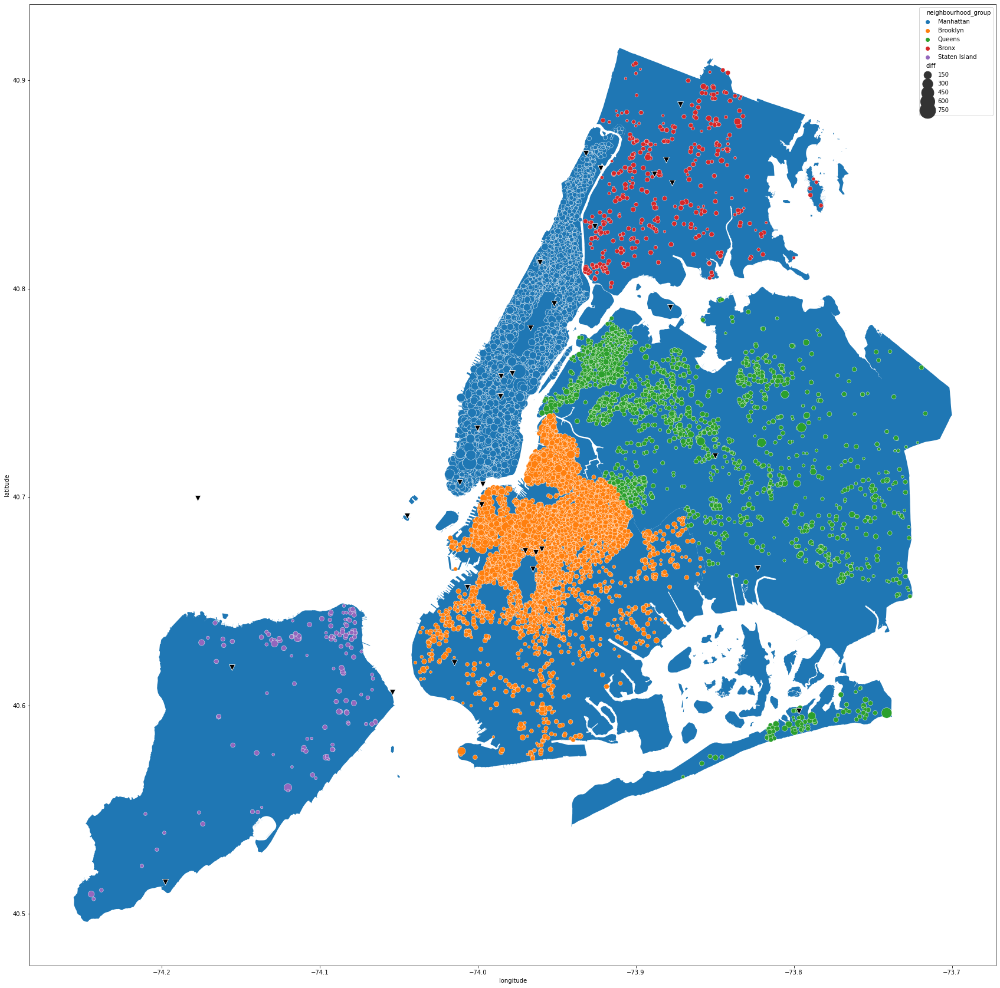

In [ ]:
fig,ax = plt.subplots(figsize=(30,30))
city_bound.plot(ax=ax)

sns.scatterplot(data=df_new, x="longitude", y="latitude", size="diff",ax=ax, hue="neighbourhood_group", sizes=(20, 800))

dicts = {"museum_of_the_city_of_new_york":[-73.95173723862581,40.792721332243424],"central_park": [-73.9665,40.7812],
         "empire_state": [-73.9857,40.7484],"swindler_cove": [-73.92222564813287,40.85773054019593], "broadway": [-73.9606094063492,40.8125904023755],
         "rockefeller center": [-73.97836830773863,40.75942720281938],"time_square": [-73.9855,40.7580], "brooklyn_bridge":[-73.99681040797579, 40.70622338681765],
         "statue_of_lib":[-74.04472552059823,40.690848574601254],"st_joseph's_church":[-74.0004287074178,40.7332446493045],"brooklyn_botanic_garden": [-73.9595,40.6751],
         "nyc_stock": [-74.01126480221173,40.70707097246732],
         "dyker_heights":[-74.01490900665057,40.62061396809141],"prospect_park_zoo": [-73.96518034611395,40.665425437973745],
         "industry_city": [-74.00676060221339,40.65666282014373], "grand army plaza" : [-73.97013613104872,40.67415497232557],
         "brooklyn jeights promenade" :[-73.99754651755569,40.69634813206317], "brooklyn_museum_fountain":[-73.9632440982908,40.67328231539857],
         "Rockaways": [-73.79696290903532,40.59738047775327], "forest_hills_stadium" : [-73.84972190036011,40.71986882944299],
         "little_italy" :[-73.8883111069597,40.85491001033554],"Cloisters" :[-73.9317166733707,40.86506562235952],
         "new_york_botanical_garden": [-73.8809571062774, 40.86187280886701], "yankee_stadium": [-73.92617095427602,40.82982931483368],
         "bronx_zoo": [-73.87713952039839,40.85075073657885],"woodlawn_cemetery": [-73.87203373104172,40.88846797239579],
         "graniteville": [-74.15561076273154,40.618268680685965],"lighthouse": [-74.05397751315259,40.60626286615651],
         "seguine_mansion": [-74.19753777338218,40.51538317680971]
         ,"jfk_airport": [-73.8231,40.6657], "lga_airport":[-73.87811641904027,40.791040353164924], "ewr_airport":[-74.1769661531896,40.69932817944298]}

# fig,ax = plt.subplots(figsize=(30,30))
# city_bound.plot(ax=ax)

x = []
y = []
for i in dicts:
  x.append(dicts[i][0])
  y.append(dicts[i][1])

sns.scatterplot(x=x, y=y,ax=ax, legend = False,s=100,color = 'k',marker = 'v')

In [ ]:
for fit_model, fit_model_name in allmodels:
  if fit_model_name == "RandomForestRegressor":
      yhat_test = fit_model.predict(X_test)
  
      perc = np.absolute(np.divide(np.subtract(np.exp(y_test),np.exp(yhat_test)),np.exp(y_test)))

      df_new["percent"] = perc[0]

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:625: UserWarning:

pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.



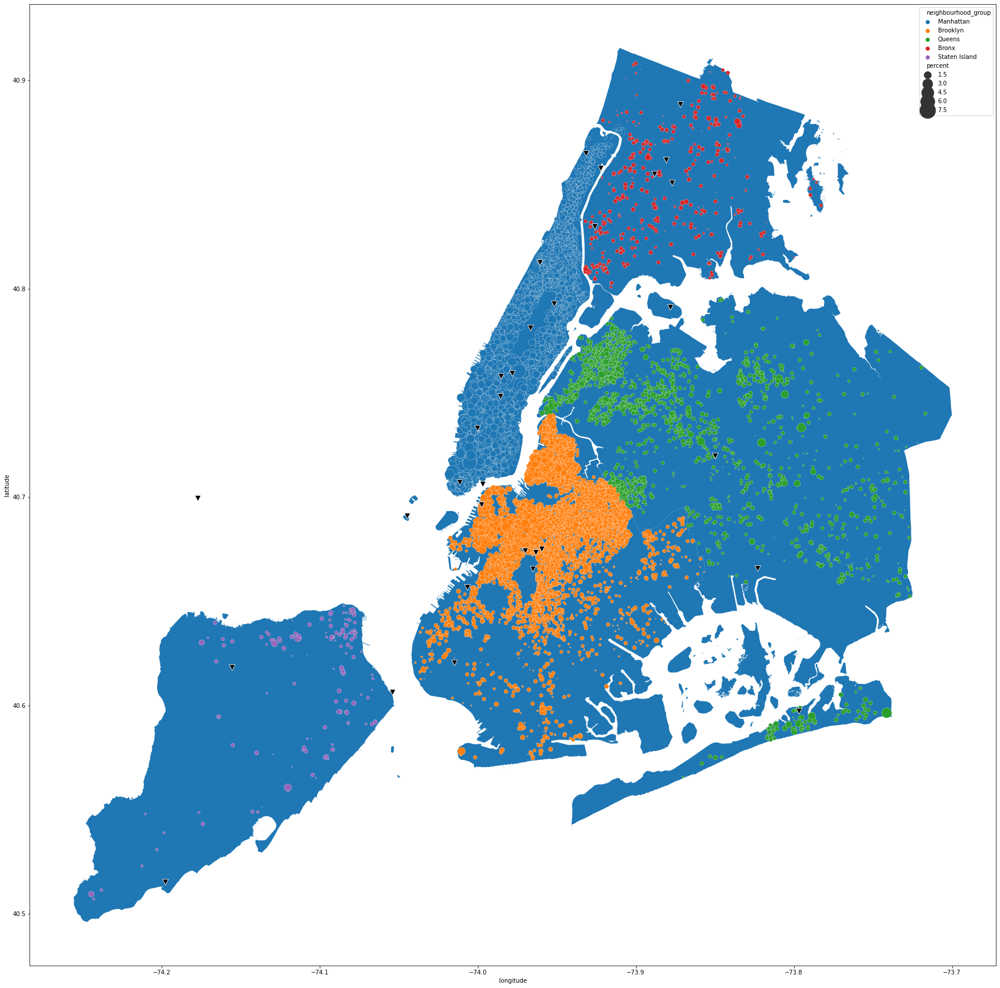

In [ ]:
fig,ax = plt.subplots(figsize=(30,30))
city_bound.plot(ax=ax)

sns.scatterplot(data=df_new, x="longitude", y="latitude", size="percent",ax=ax, hue="neighbourhood_group", sizes=(1, 800))

dicts = {"museum_of_the_city_of_new_york":[-73.95173723862581,40.792721332243424],"central_park": [-73.9665,40.7812],
         "empire_state": [-73.9857,40.7484],"swindler_cove": [-73.92222564813287,40.85773054019593], "broadway": [-73.9606094063492,40.8125904023755],
         "rockefeller center": [-73.97836830773863,40.75942720281938],"time_square": [-73.9855,40.7580], "brooklyn_bridge":[-73.99681040797579, 40.70622338681765],
         "statue_of_lib":[-74.04472552059823,40.690848574601254],"st_joseph's_church":[-74.0004287074178,40.7332446493045],"brooklyn_botanic_garden": [-73.9595,40.6751],
         "nyc_stock": [-74.01126480221173,40.70707097246732],
         "dyker_heights":[-74.01490900665057,40.62061396809141],"prospect_park_zoo": [-73.96518034611395,40.665425437973745],
         "industry_city": [-74.00676060221339,40.65666282014373], "grand army plaza" : [-73.97013613104872,40.67415497232557],
         "brooklyn jeights promenade" :[-73.99754651755569,40.69634813206317], "brooklyn_museum_fountain":[-73.9632440982908,40.67328231539857],
         "Rockaways": [-73.79696290903532,40.59738047775327], "forest_hills_stadium" : [-73.84972190036011,40.71986882944299],
         "little_italy" :[-73.8883111069597,40.85491001033554],"Cloisters" :[-73.9317166733707,40.86506562235952],
         "new_york_botanical_garden": [-73.8809571062774, 40.86187280886701], "yankee_stadium": [-73.92617095427602,40.82982931483368],
         "bronx_zoo": [-73.87713952039839,40.85075073657885],"woodlawn_cemetery": [-73.87203373104172,40.88846797239579],
         "graniteville": [-74.15561076273154,40.618268680685965],"lighthouse": [-74.05397751315259,40.60626286615651],
         "seguine_mansion": [-74.19753777338218,40.51538317680971]
         ,"jfk_airport": [-73.8231,40.6657], "lga_airport":[-73.87811641904027,40.791040353164924], "ewr_airport":[-74.1769661531896,40.69932817944298]}

# fig,ax = plt.subplots(figsize=(30,30))
# city_bound.plot(ax=ax)

x = []
y = []
for i in dicts:
  x.append(dicts[i][0])
  y.append(dicts[i][1])

sns.scatterplot(x=x, y=y,ax=ax, legend = False,s=100,color = 'k',marker = 'v')

In [ ]:
df_new.groupby("neighbourhood_group").mean()

,latitude,longitude,diff,percent
neighbourhood_group,,,,
Bronx,40.847602,-73.882279,34.939269,0.352922
Brooklyn,40.685177,-73.951191,44.468535,0.449177
Manhattan,40.765122,-73.974731,80.050322,0.808589
Queens,40.729850,-73.870998,36.534786,0.369038
Staten Island,40.610359,-74.107635,36.151050,0.365162


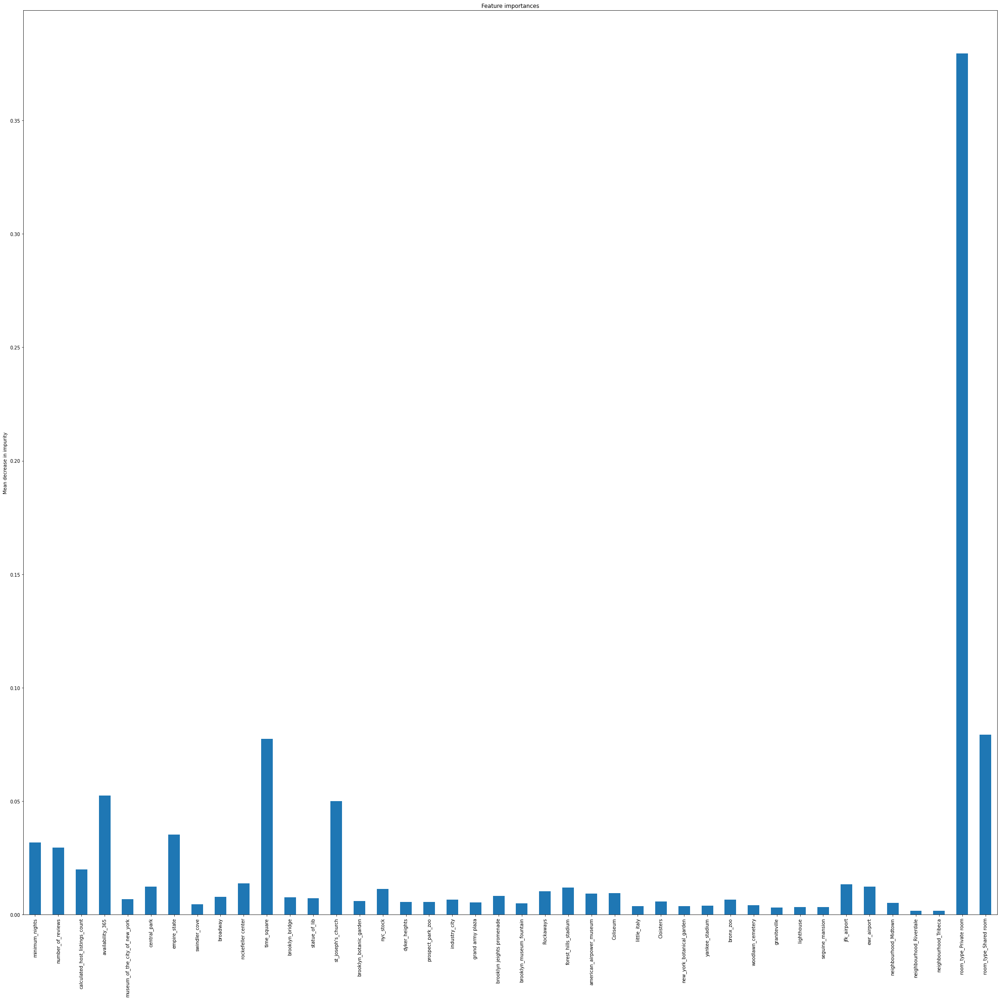

In [ ]:
for fit_model, fit_model_name in allmodels:
  if fit_model_name == "RandomForestRegressor":
      importance = fit_model.feature_importances_
      std = np.std([tree.feature_importances_ for tree in fit_model.estimators_], axis=0)
      forest_importances = pd.Series(importance, index=X_test.columns)
forest_importances_new = forest_importances[forest_importances>= 0.001]
fig, ax = plt.subplots(figsize=(30,30))
forest_importances_new.plot.bar()
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [ ]:
landmark_importance = forest_importances_new[4:37]

In [ ]:
landmark_importance_norm = landmark_importance/landmark_importance.max()

In [ ]:
landmark_importance_norm_new = landmark_importance_norm[landmark_importance_norm.index != "american_airpower_museum"]
landmark_importance_norm_new = landmark_importance_norm_new[landmark_importance_norm_new.index != "Coliseum"]

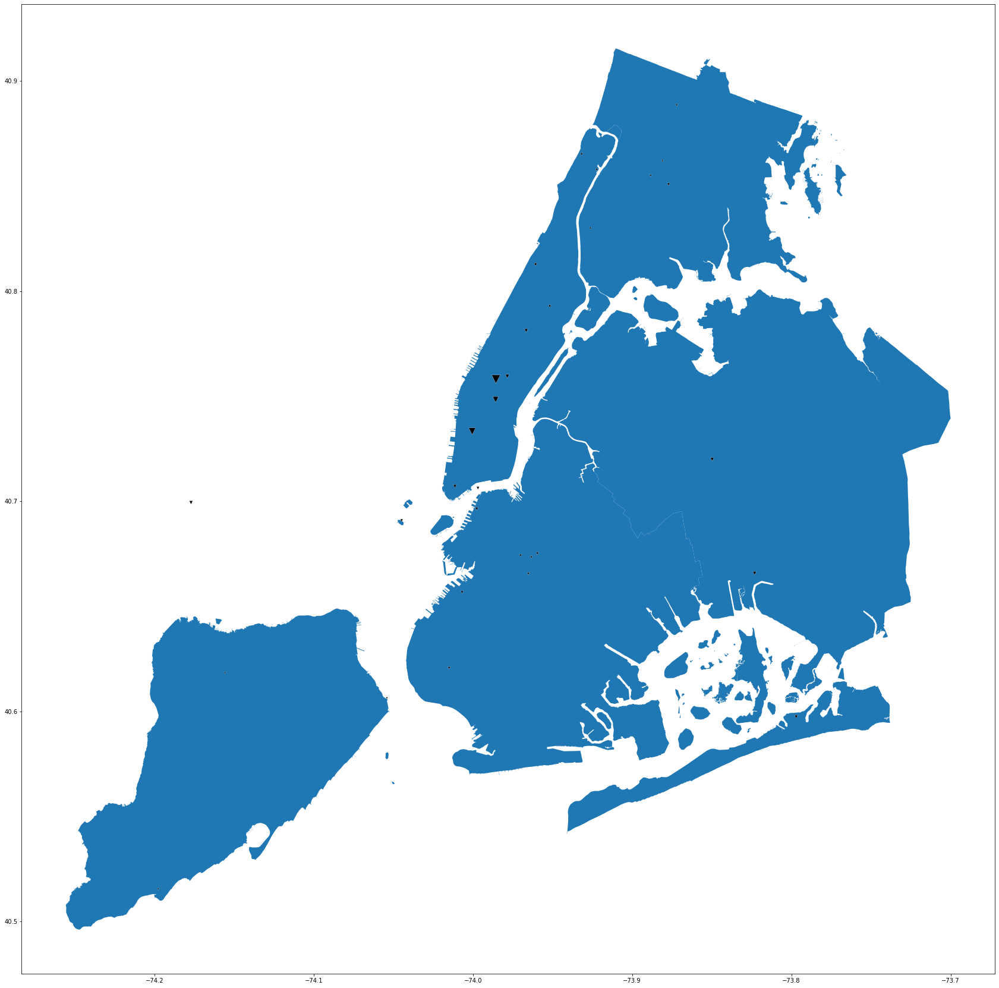

In [ ]:
dicts = {"museum_of_the_city_of_new_york":[-73.95173723862581,40.792721332243424],"central_park": [-73.9665,40.7812],
         "empire_state": [-73.9857,40.7484],"swindler_cove": [-73.92222564813287,40.85773054019593], "broadway": [-73.9606094063492,40.8125904023755],
         "rockefeller center": [-73.97836830773863,40.75942720281938],"time_square": [-73.9855,40.7580], "brooklyn_bridge":[-73.99681040797579, 40.70622338681765],
         "statue_of_lib":[-74.04472552059823,40.690848574601254],"st_joseph's_church":[-74.0004287074178,40.7332446493045],"brooklyn_botanic_garden": [-73.9595,40.6751],
         "nyc_stock": [-74.01126480221173,40.70707097246732],
         "dyker_heights":[-74.01490900665057,40.62061396809141],"prospect_park_zoo": [-73.96518034611395,40.665425437973745],
         "industry_city": [-74.00676060221339,40.65666282014373], "grand army plaza" : [-73.97013613104872,40.67415497232557],
         "brooklyn jeights promenade" :[-73.99754651755569,40.69634813206317], "brooklyn_museum_fountain":[-73.9632440982908,40.67328231539857],
         "Rockaways": [-73.79696290903532,40.59738047775327], "forest_hills_stadium" : [-73.84972190036011,40.71986882944299],
         "little_italy" :[-73.8883111069597,40.85491001033554],"Cloisters" :[-73.9317166733707,40.86506562235952],
         "new_york_botanical_garden": [-73.8809571062774, 40.86187280886701], "yankee_stadium": [-73.92617095427602,40.82982931483368],
         "bronx_zoo": [-73.87713952039839,40.85075073657885],"woodlawn_cemetery": [-73.87203373104172,40.88846797239579],
         "graniteville": [-74.15561076273154,40.618268680685965],"lighthouse": [-74.05397751315259,40.60626286615651],
         "seguine_mansion": [-74.19753777338218,40.51538317680971]
         ,"jfk_airport": [-73.8231,40.6657], "ewr_airport":[-74.1769661531896,40.69932817944298]}

fig,ax = plt.subplots(figsize=(30,30))
city_bound.plot(ax=ax)

x = []
y = []
for i in dicts:
  x.append(dicts[i][0])
  y.append(dicts[i][1])

sns.scatterplot(x=x, y=y,ax=ax, legend = False,size = landmark_importance_norm_new , color = 'k',marker = 'v', sizes = (10,200))

Benchmark Model

In [ ]:
from sklearn.dummy import DummyRegressor
model_dict = {}

In [ ]:
df.price = np.exp(df.price)
df.describe()

,id,host_id,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,museum_of_the_city_of_new_york,central_park,empire_state,...,new_york_botanical_garden,yankee_stadium,bronx_zoo,woodlawn_cemetery,graniteville,lighthouse,seguine_mansion,jfk_airport,lga_airport,ewr_airport
count,4.888300e+04,4.888300e+04,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,...,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.000000,48883.0,48883.000000
mean,1.901710e+07,6.762306e+07,152.754495,7.004460,23.272426,7.144754,112.774339,111.724069,109.781432,83.802996,...,200.705186,152.027432,230.745608,233.081082,270.558375,235.076762,389.364485,178.759930,-1.0,299.875752
std,1.098422e+07,7.861714e+07,240.172685,19.726963,44.551682,32.956510,131.623674,63.092948,66.740549,55.164576,...,70.505809,69.954627,80.163147,72.517104,59.801791,59.200323,60.687792,54.527281,0.0,57.022969
min,2.539000e+03,2.438000e+03,10.000000,1.000000,0.000000,1.000000,0.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.000000
25%,9.470616e+06,7.816856e+06,69.000000,1.000000,1.000000,1.000000,0.000000,59.321850,54.720300,41.959100,...,156.048050,102.188100,191.001050,187.330200,232.577050,196.898950,351.616750,138.483400,-1.0,265.187050
50%,1.967574e+07,3.079382e+07,106.000000,3.000000,5.000000,1.000000,45.000000,109.449200,107.363400,80.867300,...,205.288400,155.871900,241.398300,238.999900,258.499400,222.807100,377.539100,177.140600,-1.0,290.230600
75%,2.915303e+07,1.074344e+08,175.000000,5.000000,24.000000,2.000000,227.000000,151.768550,152.003350,107.125250,...,246.114400,197.492250,283.079550,279.826000,302.003600,266.308000,421.043300,213.753000,-1.0,325.123700
max,3.648724e+07,2.743213e+08,10000.000000,1000.000000,629.000000,327.000000,365.000000,548.112700,564.357100,477.476800,...,632.456300,592.259300,683.268300,666.167900,598.401400,562.705700,717.441100,536.945400,-1.0,639.250500


In [ ]:
df_benchmark = df[["price","neighbourhood_group","neighbourhood"]]
df_benchmark_target = df["price"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_benchmark, df_benchmark_target, test_size=0.33, random_state=42)

In [ ]:
train_result = X_train.groupby(by =["neighbourhood"]).mean()
train_result

,price
neighbourhood,
Allerton,86.750000
Arden Heights,72.500000
Arrochar,90.600000
Arverne,190.458333
Astoria,123.429487
...,...
Willowbrook,249.000000
Windsor Terrace,136.320000
Woodhaven,70.271186


In [ ]:
y_pred_test =[]
for i in X_test.neighbourhood:
  try:
    y_pred_test.append(train_result.price[i])
  except:
    y_pred_test.append(152.0)


In [ ]:
  MAE = metrics.mean_absolute_error((y_test),(y_pred_test))
  MSE = metrics.mean_squared_error((y_test),(y_pred_test))
  RMSE = np.sqrt(metrics.mean_squared_error((y_test), (y_pred_test)))
  MAPE = metrics.mean_absolute_percentage_error((y_test), (y_pred_test))
  R2_Score = metrics.r2_score((y_test),(y_pred_test))

  print(MAE)
  print(MSE)
  print(RMSE)
  print(MAPE)
  print(R2_Score)
  d.append(["Dummy", MAE, MSE, RMSE, MAPE, R2_Score])

81.19131367341838
51027.1759459891
225.89195635522105
0.6938014363558066
0.057669198283957


In [ ]:
summary_df = pd.DataFrame(d, columns = ['Algorithm','MAE','MSE', 'RMSE', 'MAPE', 'R2 Score'])
display(summary_df)

,Algorithm,MAE,MSE,RMSE,MAPE,R2 Score
0,KNeighborsRegressor weight uniform,60.455053,48034.423937,219.167570,0.380027,0.112937
1,KNeighborsRegressor weight distance,58.934683,47365.791305,217.636834,0.363514,0.125285
2,DecisionTreeRegressor,60.766976,51168.750766,226.205108,0.360067,0.055055
3,RandomForestRegressor,56.067468,45637.568560,213.629512,0.327556,0.157200
4,Linear Regression,59.951100,48373.530754,219.939834,0.350543,0.106675
5,Ridge,59.903543,48367.352398,219.925788,0.349835,0.106789
6,Ridge Alpha -15.9,59.951100,48373.530757,219.939834,0.350543,0.106675
7,Lasso,83.636188,55600.170518,235.796884,0.623772,-0.026781
8,Lasso Alpha -10.5,59.896783,48386.059813,219.968315,0.349655,0.106443
9,Dummy,81.191314,51027.175946,225.891956,0.693801,0.057669
